# Lab02

Simple plant and population growth models.

<div class="alert alert-warning">
If figures/tables are not rendered correctly, make sure your notebook is `trusted` by choosing `Trust Notebook` command found in `View` - `Activate Command Palette` menu. Typing in the first letters (i.e. "tr") should give you the command.
</div>

<div class="alert alert-info">
This is a student version of the notebook that some portions of code are redacted with comments like `#= .. =#`. Students are encouraged to complete the code to get same/similar results as rendered in the notebook. You may submit a complete notebook as your homework assigment. An instructor version of the notebook will be provided once the lab session is finished each week.
</div>

In [1]:
using Cropbox

## Ex 2.1.

Incorporate the differential (Eqn 2.4) and integral (Eqn 2.5) forms of the logistic equation using Cropbox package. Using the parameter values in Table 2.1, simulate both forms of the logistic model for 300 days on *daily time steps*. Plot to overlay the two forms in one figure and compare the results. Before running simulations, predict if you expect the results from both models to be identical? Why or why not? Do your simulations support your predictions? Why or why not? Test the behavior of the model with respect to its parameter values.

### Logistic growth (derivative form)

- Eqn 2.4.

$$
\frac{dW}{dt} = rW(1-\frac{W}{W_f}) = rW(\frac{W_f-W}{W_f})
$$

- Table 2.1.

| Symbol | Value | Units | Description |
| :- | :- | :- | :- |
| $t$ | - | $\mathrm{d}$ | Time unit used in the model |
| $r$ | 0.05 | $\mathrm{g}$ $\mathrm{g^{-1}}$ $\mathrm{d^{-1}}$ | Relative (or specific or intrinsic) growth rate |
| $W_0$ | 0.25 | $\mathrm{g}$ | Seed mass or initial biomass |
| $W_f$ | 300 | $\mathrm{g}$ | Potential final mass of a plant |
| $W$ | - | $\mathrm{g}$ | Whole-plant biomass as dry matter (state variable) |

Here is the model specification of Eqn 2.4 implemented on Cropbox framework. See how variables and parameters are declared each line with state verbs (`track`, `preserve`, `accumulate`) and tags (*i.e.* `parameter`, `init`, `u".."`).

- Time variable `t` is set to `track` internal time variable (`context.clock.time`) in the unit of `d` (day) converted from theg default `hr` (hour).
- Parameters `r`, `W0`, `Wf` are set to `preserve` their initial values which are declared in the body. They are tagged `parameter` indicating their values may be replaced by configuration when running simulations.
- As the state variable `W` is defined as a form of derivative ($\frac{dW}{dt}$), we want to integrate its value over time. As Cropbox is essentially a discrete-time modeling framework, what we do here is `accumulate` (summing up) instead of integration over continuous time.

In [2]:
@system Eq24(Controller) begin
    t(context.clock.time) ~ track(u"d")
    
    r:  relative_growth_rate    => 0.05 ~ preserve(parameter, u"g/g/d")
    W0: initial_biomass         => 0.25 ~ preserve(parameter, u"g")
    Wf: potential_final_biomass => 300  ~ preserve(parameter, u"g")
    
    W(r, W, Wf): biomass => begin
        r * W * (Wf - W) / Wf
    end ~ accumulate(u"g", init = W0)
end

Eq24

`simulate(<System>; ..)` function make an instance of the model system and run simulation until `stop` condition is met. Here we use `300u"d"` as a stop condition which indicates the simulation should run for 300 days. The output of `simulate()` is a table-like DataFrame with column names from variables specified in the model.

In [3]:
r24 = simulate(Eq24; stop = 300u"d")

Progress: 100%[===========================] Time: 0:00:01 ( 0.24 ms/it)


,time,t,r,W0,Wf,W
,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…
1,0.0 hr,0.0 d,0.05 d^-1,0.25 g,300.0 g,0.25 g
2,1.0 hr,0.0416667 d,0.05 d^-1,0.25 g,300.0 g,0.25052 g
3,2.0 hr,0.0833333 d,0.05 d^-1,0.25 g,300.0 g,0.251042 g
4,3.0 hr,0.125 d,0.05 d^-1,0.25 g,300.0 g,0.251564 g
5,4.0 hr,0.166667 d,0.05 d^-1,0.25 g,300.0 g,0.252088 g
6,5.0 hr,0.208333 d,0.05 d^-1,0.25 g,300.0 g,0.252613 g
7,6.0 hr,0.25 d,0.05 d^-1,0.25 g,300.0 g,0.253139 g
8,7.0 hr,0.291667 d,0.05 d^-1,0.25 g,300.0 g,0.253666 g
9,8.0 hr,0.333333 d,0.05 d^-1,0.25 g,300.0 g,0.254194 g


We can draw a graph with `visualize(<DataFrame>, <x>, <y>; ..)` function with the DataFrame output. By default, `kind` option is set to `:scatter` which could be inefficient to plot too many data points, so let's use `:line` to draw a simple line plot.

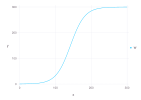

In [4]:
visualize(r24, :t, :W; kind = :line)

Note that models in Cropbox have a default clock set in hourly time step (`context.clock.step`). We can change the time step by providing a user configuration. Configuration is in a two-level mapping like `<System> => <Variable> => <Value>`. Cropbox provides several ways for constructing configurations and one simple way is to use a pair of pair with nested `=>`.

In [5]:
c = Clock => :step => 1u"d"

Clock => (:step => 1 d)

Here we make a configuration `c` for system `Clock` and want to have its variable `step` to be `1u"d"` (1 day). We can take a look at how this pair of pair structure transformed into an actual instance of configuration by calling `@config` macro on it. This is how configurations supplied to `simulate()` are transformed internally.

In [6]:
@config(c)

step,=,24 hr


Now we re-run the simulation with the custom configuration `c` for using daily time step.

In [7]:
r24 = simulate(Eq24; config = c, stop = 300u"d")

,time,t,r,W0,Wf,W
,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…
1,0.0 hr,0.0 d,0.05 d^-1,0.25 g,300.0 g,0.25 g
2,24.0 hr,1.0 d,0.05 d^-1,0.25 g,300.0 g,0.26249 g
3,48.0 hr,2.0 d,0.05 d^-1,0.25 g,300.0 g,0.275603 g
4,72.0 hr,3.0 d,0.05 d^-1,0.25 g,300.0 g,0.28937 g
5,96.0 hr,4.0 d,0.05 d^-1,0.25 g,300.0 g,0.303825 g
6,120.0 hr,5.0 d,0.05 d^-1,0.25 g,300.0 g,0.319 g
7,144.0 hr,6.0 d,0.05 d^-1,0.25 g,300.0 g,0.334934 g
8,168.0 hr,7.0 d,0.05 d^-1,0.25 g,300.0 g,0.351661 g
9,192.0 hr,8.0 d,0.05 d^-1,0.25 g,300.0 g,0.369224 g


Note that `t` values are now one day (`1u"d"`) apart.

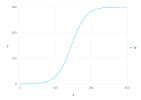

In [8]:
visualize(r24, :t, :W; kind = :line)

### Logisitc growth (integrated form)

- Eqn 2.5.

$$
W = \frac{W_0 W_f}{W_0 + (W_f-W_0)e^{-rt}} = \frac{W_f}{1 + (\frac{W_f}{W_0}-1)e^{-rt}}
$$

- Table 2.1.

| Symbol | Value | Units | Description |
| :- | :- | :- | :- |
| $t$ | - | $\mathrm{d}$ | Time unit used in the model |
| $r$ | 0.05 | $\mathrm{g}$ $\mathrm{g^{-1}}$ $\mathrm{d^{-1}}$ | Relative (or specific or intrinsic) growth rate |
| $W_0$ | 0.25 | $\mathrm{g}$ | Seed mass or initial biomass |
| $W_f$ | 300 | $\mathrm{g}$ | Potential final mass of a plant |
| $W$ | - | $\mathrm{g}$ | Whole-plant biomass as dry matter (state variable) |

Specification of system `Eq25` looks similar to `Eq24` except that the state variable `W` is no longer a part of the derivative, but already included in the form of integral. Thus, what we need here is to just re-calculate `W` every time step, instead of doing accumulation / integration based on previous values. `track` is used for such variables only relying on the current state of system.

In [9]:
@system Eq25(Controller) begin
    t(context.clock.time) ~ track(u"d")
    
    r:  relative_growth_rate    => #= .. =# ~ preserve(parameter, u"g/g/d")
    W0: initial_biomass         => #= .. =# ~ preserve(parameter, u"g")
    Wf: potential_final_biomass => #= .. =# ~ preserve(parameter, u"g")
    
    W(r, W0, Wf, t): biomass => begin
        Wf / (#= .. =# * exp(-r*t))
    end ~ track(u"g")
end

Eq25

In [10]:
r25 = simulate(Eq25; config = c, #= .. =#)

,time,t,r,W0,Wf,W
,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…
1,0.0 hr,0.0 d,0.05 d^-1,0.25 g,300.0 g,0.25 g
2,24.0 hr,1.0 d,0.05 d^-1,0.25 g,300.0 g,0.262807 g
3,48.0 hr,2.0 d,0.05 d^-1,0.25 g,300.0 g,0.276269 g
4,72.0 hr,3.0 d,0.05 d^-1,0.25 g,300.0 g,0.290419 g
5,96.0 hr,4.0 d,0.05 d^-1,0.25 g,300.0 g,0.305294 g
6,120.0 hr,5.0 d,0.05 d^-1,0.25 g,300.0 g,0.32093 g
7,144.0 hr,6.0 d,0.05 d^-1,0.25 g,300.0 g,0.337366 g
8,168.0 hr,7.0 d,0.05 d^-1,0.25 g,300.0 g,0.354643 g
9,192.0 hr,8.0 d,0.05 d^-1,0.25 g,300.0 g,0.372803 g


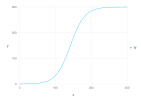

In [11]:
visualize(r25, #= .. =#, #= .. =#; kind = :line)

### Plot overlay

We can overlay multiple plots with consecutive calls of `visualize!(<Plot>, ...)` with a Plot object returned by previous `visualize()` or `visualize!()` function.

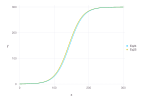

In [12]:
p = visualize(r24, :t, :W; kind = :line, name = "Eq24")
visualize!(p, r25, :t, :W; kind = :line, name = "Eq25")

In [13]:
typeof(p)

Cropbox.Plot{Gadfly.Plot}

Cropbox also provides some high-level plotting functions to make a plot without manually running simulations first. One form of such `visualize()` functions is `visualize([<System>..], <x>, <y>; <simulate() options>.., <plotting options..>)` to make a plot with multiple overlays in one line of code.

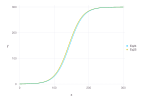

In [14]:
visualize([Eq24, Eq25], :t, :W; config = c, stop = 300u"d", kind = :line)

You may now notice a small difference between two implementations of logistic growth models. Answer the question above and discuss with others.

## Ex 2.2.

Create a system to implement the density-independent Lotka-Volterra model (Eqn 2.8) using Cropbox package. Using your guesstimates, find the set of parameter values and initial conditions by eyes that mimic the population dynamics shown in Fig. 2.1b. Repeat this process until you are satisfied with the result. What are their values? Do you think those values are reasonable and realistic ecologically?

### Lotka-Volterra model

- Eqn 2.8.

$$
\begin{align}
\frac{dN}{dt} &= bN - aNP \\
\frac{dP}{dt} &= caNP - mP \\
\end{align}
$$

- Table 2.1.

| Symbol | Value | Units | Description |
| :- | :- | :- | :- |
| $t$ | - | $\mathrm{yr}$ | Time unit used in the model |
| $N$ | - | - | Prey population as number of individuals (state variable) |
| $P$ | - | - | Predator population as number of individuals (state variable) |
| $b$ | - | $\mathrm{yr^{-1}}$ | Per capital birth rate that defines the intrinsic growth rate of prey population |
| $a$ | - | $\mathrm{yr^{-1}}$ | Attack rate or predation rate |
| $c$ | - | - | Conversion efficiency of an eaten prey into new predator; predator's reproduction efficiency per prey consumed) |
| $m$ | - | $\mathrm{yr^{-1}}$ | Mortality rate of predator population |

- Fig. 2.1b

![Fig. 2.1b](http://www2.nau.edu/lrm22/lessons/predator_prey/hare_lynx_graph.png)

Model specification of `LotkaVolterra` resembles what we did with `Eq24` for logistic growth model in a derivative form.

In [15]:
@system LotkaVolterra(Controller) begin
    t(context.clock.time) ~ track(u"yr")
    
    N(N, P, b, a):    prey_population     => #= .. =# ~ accumulate(init = N0)
    P(N, P, c, a, m): predator_population => #= .. =# ~ accumulate(init = P0)
    
    N0: prey_initial_population     ~ preserve(parameter)
    P0: predator_initial_population ~ preserve(parameter)
    
    b: prey_birth_rate            ~ preserve(parameter, u"yr^-1")
    a: predation_rate             ~ preserve(parameter, u"yr^-1")
    c: predator_reproduction_rate ~ preserve(parameter)
    m: predator_mortality_rate    ~ preserve(parameter, u"yr^-1")
end

LotkaVolterra

We can take a look at the dependency between variables declared in the system by calling `Cropbox.dependency(<System>)`.

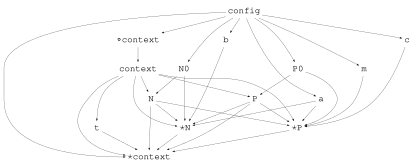

In [16]:
Cropbox.dependency(LotkaVolterra)

Similarly, a hierarchy between mix-in systems can be drawn by `Cropbox.hierarchy(<System>)`. Solid line indicates *has* relationship meaning the target system contains an instance of source system. Dashed line indicates *is* relationship meaning the target system is composed of source system as a mix-in.

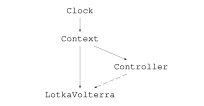

In [17]:
Cropbox.hierarchy(LotkaVolterra)

Here, we make a configuration for setting parameters for `LotkaVolterra` system we've just made above. We'll use a daily time step.

In [18]:
lvc = @config (
    Clock => (;
        step = 1u"d",
    ),
    LotkaVolterra => (;
        b = 0.6,
        a = 0.02,
        c = 0.5,
        m = 0.5,
        N0 = 20,
        P0 = 30,
    ),
)

step,=,24 hr
b,=,0.6 yr^-1
a,=,0.02 yr^-1
c,=,0.5
m,=,0.5 yr^-1
N0,=,20
P0,=,30


Let's make a simulation plot and see how it compares to the original dataset. Note we use a variant `visualize(<System>, <x>, [<y>..]; ..)` with multiple target variables mapped to multiple series of lines.

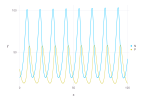

In [19]:
visualize(LotkaVolterra, :t, [:N, :P]; config = lvc, stop = 100u"yr", kind = :line)

Repeat this process until you are satisfied with the result. What are their values? Do you think those values are ecologically realistic?

### Ex 2.3.

Repeat the previous exercise for the *density-dependent* Lotka-Volterra model (Eqn 2.9). Does this model do a better job mimicking the observations than the density-independent model? Why do you think that's the case? Which model do you prefer to use and why?

- Eqn 2.9.

$$
\begin{align}
\frac{dN}{dt} &= bN-\frac{b}{K}N^2-aNP \\
\frac{dP}{dt} &= caNP-mP \\
\end{align}
$$

- Table 2.1.

| Symbol | Value | Units | Description |
| :- | :- | :- | :- |
| $t$ | - | $\mathrm{yr}$ | Time unit used in the model |
| $N$ | - | - | Prey population as number of individuals (state variable) |
| $P$ | - | - | Predator population as number of individuals (state variable) |
| $b$ | - | $\mathrm{yr^{-1}}$ | Per capital birth rate that defines the intrinsic growth rate of prey population |
| $a$ | - | $\mathrm{yr^{-1}}$ | Attack rate or predation rate |
| $c$ | - | - | Conversion efficiency of an eaten prey into new predator; predator's reproduction efficiency per prey consumed) |
| $m$ | - | $\mathrm{yr^{-1}}$ | Mortality rate of predator population |
| $K$ | - | - | Carrying capacity of the system for prey population |

We can make a density-dependent version of the model `LotkaVoleterraDD` by reusing `LotkaVoleterra` as a mix-in. Note that base model `LotkaVoletrra` is indicated in the first line of arguments list of `@system` declaration, meaning declarations of variables for `LotkaVoletrra` are imported and available for `LotkaVolterraDD`. That's why we only need to provide a change or difference in terms of variable declaration in the new model, leading to a much compact specification. Here declaration of prey population `N` is overwritten by a new statement with an additionally introduced parameter `K` for carrying capacity.

In [20]:
@system LotkaVolterraDD(LotkaVolterra, Controller) begin
    N(N, P, K, b, a): prey_population => begin
        #= .. =#
    end ~ accumulate(init = N0)
    
    K: carrying_capacity ~ preserve(parameter)
end

LotkaVolterraDD

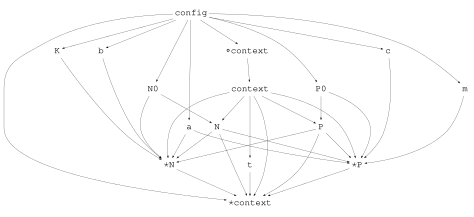

In [21]:
Cropbox.dependency(LotkaVolterraDD)

A hierarchy graph shows how `LotkaVolterraDD` is based on `LotkaVolterra` as a mix-in.

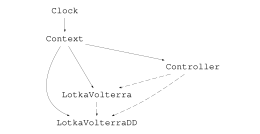

In [22]:
Cropbox.hierarchy(LotkaVolterraDD)

Similarly to how a new system can be derived from existing ones, a new configuration can be also built by a collection of existing configruations in the form of `(A, B, C...)` where a new configuration is based on the existing configuration A, overlaid by B, then overlaid by C, and so on.

Here we make a new configuration `lvddc` for `LotkaVolterraDD` based on `lvc` for `LotkaVolterra` with an additional parameter for carrying capacity `K`.

In [23]:
lvddc = @config (lvc,
    LotkaVolterraDD => (;
        K = 1000,
    ),
)

step,=,24 hr
b,=,0.6 yr^-1
a,=,0.02 yr^-1
c,=,0.5
m,=,0.5 yr^-1
N0,=,20
P0,=,30
K,=,1000


Let's run the simulation for `LotkaVolterraDD` and a new configuration `lvddc`.

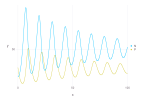

In [24]:
visualize(LotkaVolterraDD, :t, [:N, :P]; config = lvddc, stop = 100u"yr", kind = :line)

Does thismodel do a better job mimicking the observations than the density-independent model? Why do you think that’s the case? Which model do you prefer to use and why?

## Ex 2.4.

In this exercise, you will use the *density dependent* L-V model to find the parameter combinations and initial conditions of state variables that satisfy the following scenarios for 100 years. Note that there could be multiple solutions. You just need to show one set that works for each case.

Here is the configuration we used above. Let's try making a different set of parameters for simulating a desired behavior. Note that the figures rendered below are just examples. You don't have to replicate them.

In [25]:
@config(lvddc)

step,=,24 hr
b,=,0.6 yr^-1
a,=,0.02 yr^-1
c,=,0.5
m,=,0.5 yr^-1
N0,=,20
P0,=,30
K,=,1000


### a. Prey dies out slowly, then predator dies out.

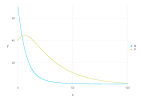

In [26]:
visualize(LotkaVolterraDD, :t, [:N, :P];
    config = (
        lvddc,
        LotkaVolterraDD => (;
            b = #= .. =#,
            a = #= .. =#,
            c = #= .. =#,
            m = #= .. =#,
            K = #= .. =#,
            N0 = #= .. =#,
            P0 = #= .. =#,
        ),
    ),
    stop = 100u"yr", 
    kind = :line,
)

### b. Predator dies out and prey does not.

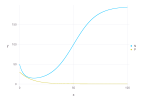

In [27]:
visualize(LotkaVolterraDD, :t, [:N, :P];
    config = (
        lvddc,
        LotkaVolterraDD => (;
            b = #= .. =#,
            a = #= .. =#,
            c = #= .. =#,
            m = #= .. =#,
            K = #= .. =#,
            N0 = #= .. =#,
            P0 = #= .. =#,
        ),
    ),
    stop = 100u"yr",
    kind = :line,
)

### c. Both predator and prey populations oscillate perpetually.

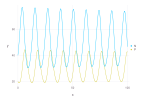

In [28]:
visualize(LotkaVolterraDD, :t, [:N, :P];
    config = (
        lvddc,
        LotkaVolterraDD => (;
            b = #= .. =#,
            a = #= .. =#,
            c = #= .. =#,
            m = #= .. =#,
            K = #= .. =#,
            N0 = #= .. =#,
            P0 = #= .. =#,
        ),
    ),
    stop = 100u"yr",
    kind = :line,
)

### d. Both predator and prey populations stabilize over time to reach an equilibrium.

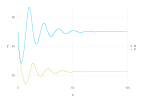

In [29]:
visualize(LotkaVolterraDD, :t, [:N, :P];
    config = (
        lvddc,
        LotkaVolterraDD => (;
            b = #= .. =#,
            a = #= .. =#,
            c = #= .. =#,
            m = #= .. =#,
            K = #= .. =#,
            N0 = #= .. =#,
            P0 = #= .. =#,
        ),
    ),
    stop = 100u"yr",
    kind = :line,
)

## Cropbox Internals

Let's make an instance of `LotkaVolterraDD` system with configuration `lvddc`.

In [30]:
s = instance(LotkaVolterraDD; config = lvddc)

LotkaVolterraDD
  context = <Context>
  config = <Config>
  t = 0.0 yr
  N (prey_population) = 20.0
  P (predator_population) = 30.0
  N0 (prey_initial_population) = 20.0
  P0 (predator_initial_population) = 30.0
  b (prey_birth_rate) = 0.6 yr^-1
  a (predation_rate) = 0.02 yr^-1
  c (predator_reproduction_rate) = 0.5
  m (predator_mortality_rate) = 0.5 yr^-1
  K (carrying_capacity) = 1000.0

#### Alias

We have two state variables `N` and `P` that are declared as a kind of `accumulate`. The rate calculation code for each variable resembles its corresponding mathematical equation. Note that `N` and `P` are short abbreviations for longer names `prey_population` and `predator_population`, respectively. By having a descriptive long alias which can be also referred by a short name, we keep our model specification concise without losing expressivity.

In [31]:
s.N

20.0

In [32]:
s.prey_population

20.0

#### State vs. Value

`s.prey_population` and `s.N` both point to an instance of the exactly same state variable.

In [33]:
s.prey_population === s.N

true

Note that what they return is not an actual value stored in the state variable, but the data structure (of type `State`) which is essentially a wrapper around the actual value. We can get the type of variable by calling `typeof()` function provided by Julia.

In [34]:
typeof(s.N)

Cropbox.Accumulate{Float64, Unitful.Quantity{Float64, 𝐓, Unitful.FreeUnits{(hr,), 𝐓, nothing}}, Unitful.Quantity{Float64, 𝐓^-1, Unitful.FreeUnits{(hr^-1,), 𝐓^-1, nothing}}}

To get an actual value stored in the state variable, we can use `value()` function from Cropbox.

In [35]:
value(s.N)

20.0

Alternatively, we can also use postfix adjoint operator `'` and dereference operator `[]` which are specifically defined as a shortcut to `Cropbox.value()` in the case of `State` type.

In [36]:
s.N'

20.0

In [37]:
typeof(s.N')

Float64

In [38]:
s.N[]

20.0

In [39]:
typeof(s.N[])

Float64

#### Units

Note that we defined units for rate parameters `a`, `b`, and `c`. `u".."` is actually a shortcut to `@u_str("..")` macro provided by [Unitful.jl](https://github.com/PainterQubits/Unitful.jl) package that Cropbox relies on to support unit conversion and validation.

In [40]:
u"yr^-1"

yr^-1

`u"yr^-1"` tag in our model specification is actually a shorthand notation for `unit = u"yr^-1"`. For example, `a ~ preserve(u"m")` expands to `a ~ preserve(unit = u"m")`.

By default, time variables used by Cropbox framework are defined in an hourly unit (`u"hr"`).
For simulation, you can still choose whichever time step you'd like to use by changing `step` parameter of `Clock` in `Context`. We already did this by creating a custom configuration above.

You should be cautious when using some larger time units like month and year. `1 yr` is defined to be `365.25 d` following the [convention](https://github.com/PainterQubits/Unitful.jl/pull/288) used in Astronomy. There is no unit for month due to ambiguity.

We can check the unit of state variable or its value by calling `Cropbox.unittype()`.

In [41]:
s.a

0.02 yr^-1

In [42]:
Cropbox.unittype(s.a)

yr^-1

In [43]:
Cropbox.unittype(s.a')

yr^-1

#### Parameter

We can look up a list of default parameters declared for a given system by calling `parameters()`.

In [44]:
parameters(LotkaVolterraDD)

N0,=,nothing
a,=,nothing
b,=,nothing
K,=,nothing
P0,=,nothing
m,=,nothing
c,=,nothing


Since `LotkaVolterraDD` had no default parameter values declared in the model itself, let's instead take a look at `Eq24`.

In [45]:
parameters(Eq24)

r,=,0.05 d^-1
W0,=,0.25 g
Wf,=,300 g


If you prefer long descriptive names, set `alias=true`.

In [46]:
parameters(Eq24, alias = true)

relative_growth_rate,=,0.05 d^-1
initial_biomass,=,0.25 g
potential_final_biomass,=,300 g


It also accepts a keyword argument named `recursive` to look up other systems contained by the target system. For example, every system has `Context` which contains `Clock` and all of their parameters can be retrieved as below.

In [47]:
parameters(Eq24, recursive = true)

init,=,0 hr
step,=,1 hr
r,=,0.05 d^-1
W0,=,0.25 g
Wf,=,300 g
